In [ ]:
!pip install neurokit2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.4/708.4 kB 13.2 MB/s eta 0:00:00


In [28]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.io import wavfile
import librosa
import librosa.display
import neurokit2 as nk
import pandas as pd
from IPython.display import Audio, display
from scipy.signal import savgol_filter

In [ ]:
plt.rcParams['figure.figsize'] = [15, 5]
plt.style.use('ggplot')

print("Libraries imported successfully!")

Libraries imported successfully!


In [ ]:
files = {
    "normal": "olena_normal.wav",
    "fatigue": "olena_fatigue.wav",
    "cough": "olena_cough.wav"
}

In [36]:
def load_and_play(key, fileset):
    filename = fileset[key]
    # librosa loads as float32, sr=None preserves original sampling rate
    y, sr = librosa.load(filename, sr=None)
    duration = len(y) / sr

    print(f"Loaded: {filename}")
    print(f"Sample Rate: {sr} Hz")
    print(f"Duration: {duration:.2f} seconds")

    # Show the audio player
    display(Audio(y, rate=sr))
    return y, sr

Loaded: olena_normal.wav
Sample Rate: 16000 Hz
Duration: 72.39 seconds


Loaded: olena_fatigue.wav
Sample Rate: 16000 Hz
Duration: 65.51 seconds


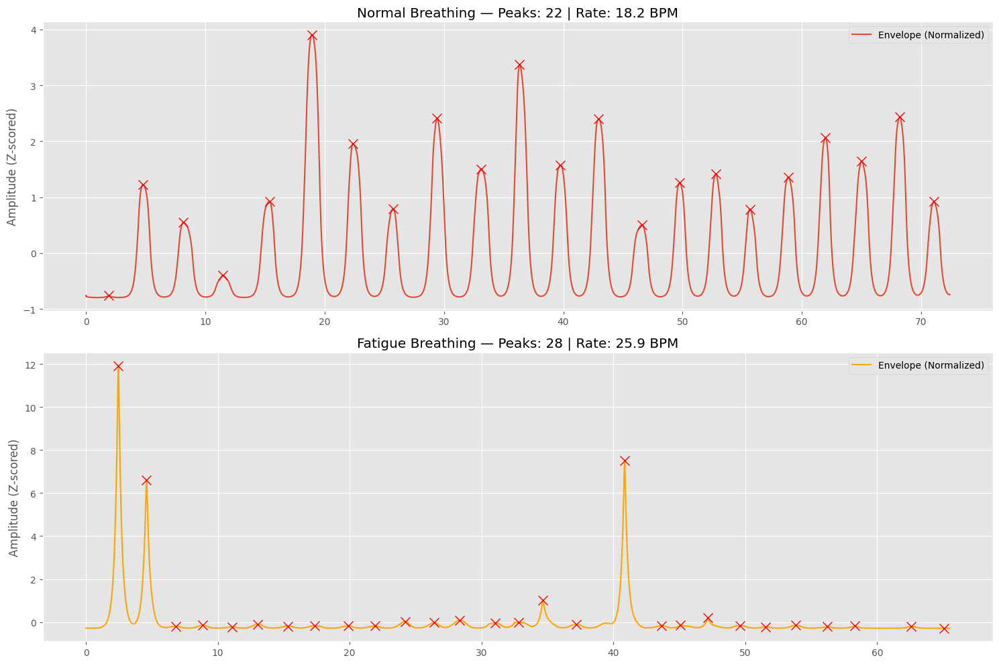

In [37]:
# ============================================================
# NEW AMPLITUDE-INVARIANT PIPELINE
# ============================================================

import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# 1. NEW BREATHING ENVELOPE (Hilbert + Median + Z-score)
# ------------------------------------------------------------
def extract_breathing_envelope_fixed(y, sr):
    # Normalize audio
    y = y / (np.max(np.abs(y)) + 1e-8)

    # Hilbert analytic envelope
    analytic = signal.hilbert(y)
    envelope = np.abs(analytic)

    # Savitzky-Golay smoothing (no shoulder creation)
    envelope = savgol_filter(envelope, window_length=201, polyorder=3)

    # Light low-pass filter
    b, a = signal.butter(1, 0.7 / (sr / 2), btype='low')
    envelope = signal.filtfilt(b, a, envelope)

    # Z-score normalization
    envelope = (envelope - np.mean(envelope)) / (np.std(envelope) + 1e-8)

    # Downsample
    target_sr = 100
    n = int(len(envelope) * target_sr / sr)
    envelope = signal.resample(envelope, n)

    return envelope, target_sr



# ------------------------------------------------------------
# 2. NEW PEAK DETECTION (percentile-based + width constraints)
# ------------------------------------------------------------
def detect_breath_peaks_fixed(env, sr):
    # 1. Smooth derivative
    d = np.gradient(env)
    d = signal.medfilt(d, kernel_size=101)

    # 2. Zero-crossings from + to -
    zero_crossings = np.where(np.diff(np.sign(d)) < 0)[0]

    # 3. Minimum physiologic breath interval (0.8s)
    min_dist = int(0.8 * sr)

    filtered = []
    last = -9999

    for z in zero_crossings:
        if z - last > min_dist:
            filtered.append(z)
            last = z

    filtered = np.array(filtered)

    # 4. Compute breathing rate
    if len(filtered) > 1:
        intervals = np.diff(filtered) / sr
        bpm = 60 / np.mean(intervals)
    else:
        bpm = 0

    return filtered, bpm




# ============================================================
#    PROCESSING NORMAL + FATIGUE SIGNALS WITH NEW PIPELINE
# ============================================================

# ---- NORMAL ----
y_normal, sr_normal = load_and_play("normal", files)
env_normal, sr_env = extract_breathing_envelope_fixed(y_normal, sr_normal)
peaks_normal, bpm_normal = detect_breath_peaks_fixed(env_normal, sr_env)

# ---- FATIGUE ----
y_fatigue, sr_fatigue = load_and_play("fatigue", files)
env_fatigue, _ = extract_breathing_envelope_fixed(y_fatigue, sr_fatigue)
peaks_fatigue, bpm_fatigue = detect_breath_peaks_fixed(env_fatigue, sr_env)


# ============================================================
# 3. VISUALIZATION
# ============================================================

plt.figure(figsize=(15, 10))

# ----- Normal -----
plt.subplot(2, 1, 1)
t_normal = np.linspace(0, len(env_normal)/sr_env, len(env_normal))
plt.plot(t_normal, env_normal, label="Envelope (Normalized)")
plt.plot(t_normal[peaks_normal], env_normal[peaks_normal], "rx", markersize=10)
plt.title(f"Normal Breathing — Peaks: {len(peaks_normal)} | Rate: {bpm_normal:.1f} BPM")
plt.ylabel("Amplitude (Z-scored)")
plt.legend()

# ----- Fatigue -----
plt.subplot(2, 1, 2)
t_fatigue = np.linspace(0, len(env_fatigue)/sr_env, len(env_fatigue))
plt.plot(t_fatigue, env_fatigue, label="Envelope (Normalized)", color="orange")
plt.plot(t_fatigue[peaks_fatigue], env_fatigue[peaks_fatigue], "rx", markersize=10)
plt.title(f"Fatigue Breathing — Peaks: {len(peaks_fatigue)} | Rate: {bpm_fatigue:.1f} BPM")
plt.ylabel("Amplitude (Z-scored)")
plt.legend()

plt.tight_layout()
plt.show()


In [38]:
further_files = {
    "normal": "yernur_normal.wav",
    "fatigue": "yernur_fatigue.wav",
    "cough": "yernur_cough.wav"
}

Loaded: yernur_normal.wav
Sample Rate: 16000 Hz
Duration: 70.27 seconds


Loaded: yernur_fatigue.wav
Sample Rate: 16000 Hz
Duration: 52.05 seconds


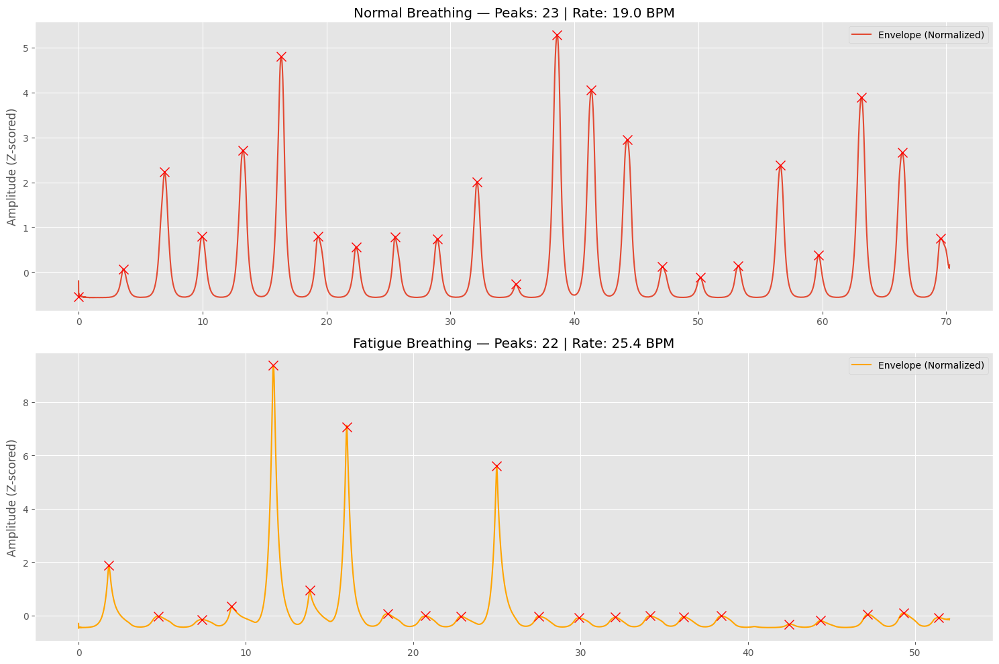

In [39]:
# ---- NORMAL ----
y_normal, sr_normal = load_and_play("normal", further_files)
env_normal, sr_env = extract_breathing_envelope_fixed(y_normal, sr_normal)
peaks_normal, bpm_normal = detect_breath_peaks_fixed(env_normal, sr_env)

# ---- FATIGUE ----
y_fatigue, sr_fatigue = load_and_play("fatigue", further_files)
env_fatigue, _ = extract_breathing_envelope_fixed(y_fatigue, sr_fatigue)
peaks_fatigue, bpm_fatigue = detect_breath_peaks_fixed(env_fatigue, sr_env)


# ============================================================
# 3. VISUALIZATION
# ============================================================

plt.figure(figsize=(15, 10))

# ----- Normal -----
plt.subplot(2, 1, 1)
t_normal = np.linspace(0, len(env_normal)/sr_env, len(env_normal))
plt.plot(t_normal, env_normal, label="Envelope (Normalized)")
plt.plot(t_normal[peaks_normal], env_normal[peaks_normal], "rx", markersize=10)
plt.title(f"Normal Breathing — Peaks: {len(peaks_normal)} | Rate: {bpm_normal:.1f} BPM")
plt.ylabel("Amplitude (Z-scored)")
plt.legend()

# ----- Fatigue -----
plt.subplot(2, 1, 2)
t_fatigue = np.linspace(0, len(env_fatigue)/sr_env, len(env_fatigue))
plt.plot(t_fatigue, env_fatigue, label="Envelope (Normalized)", color="orange")
plt.plot(t_fatigue[peaks_fatigue], env_fatigue[peaks_fatigue], "rx", markersize=10)
plt.title(f"Fatigue Breathing — Peaks: {len(peaks_fatigue)} | Rate: {bpm_fatigue:.1f} BPM")
plt.ylabel("Amplitude (Z-scored)")
plt.legend()

plt.tight_layout()
plt.show()
